<figure>
<img src="../Imagenes/logo-final-ap.png"  width="80" height="80" align="left"/> 
</figure>

# <span style="color:blue"><left>Aprendizaje Profundo</left></span>

# <span style="color:red"><center>Generación de Rostros Artificiales usando DCGAN's</center></span>

<figure>
<center>
<img src="../Imagenes/ROSTROS_II.JPG" width="600" height="600" align="center"/>
</center>
<figcaption>
<p style="text-align:center">Rostros </p>
</figcaption>
</figure>

Fuente: <a href="https://commons.wikimedia.org/wiki/File:ROSTROS_II.JPG">Henry.loayza</a>, <a href="https://creativecommons.org/licenses/by-sa/3.0">CC BY-SA 3.0</a>, via Wikimedia Commons

## <span style="color:#4361EE">Coordinador</span>

- Campo Elías Pardo Turriago, cepardot@unal.edu.co 

## <span style="color:#4361EE">Profesores</span>

1. Alvaro  Montenegro, PhD, ammontenegrod@unal.edu.co
1. Camilo José Torres Jiménez, Msc, cjtorresj@unal.edu.co
1. Daniel  Montenegro, Msc, dextronomo@gmail.com 

## <span style="color:#4361EE">Asesora Medios y Marketing digital</span>

4. Maria del Pilar Montenegro, pmontenegro88@gmail.com
5. Jessica López Mejía, jelopezme@unal.edu.co

## <span style="color:#4361EE">Jefe Jurídica</span>

6. Paula Andrea Guzmán, guzmancruz.paula@gmail.com

## <span style="color:#4361EE">Coordinador Jurídico</span>

7. David Fuentes, fuentesd065@gmail.com

## <span style="color:#4361EE">Desarrolladores Principales</span>

8. Dairo Moreno, damoralesj@unal.edu.co
9. Joan Castro, jocastroc@unal.edu.co
10. Bryan Riveros, briveros@unal.edu.co
11. Rosmer Vargas, rovargasc@unal.edu.co
12. Venus Puertas, vpuertasg@unal.edu.co

## <span style="color:#4361EE">Expertos en Bases de Datos</span>

13. Giovvani Barrera, udgiovanni@gmail.com
14. Camilo Chitivo, cchitivo@unal.edu.co

## <span style="color:blue">Referencias</span>

1. [Rowel Atiesa, Advanced Deep Learning with Tensorflow 2 and Keras, second ed., Pack, 2020](https://www.oreilly.com/library/view/advanced-deep-learning/9781838821654/)
1. [Ejemplos de Keras](https://keras.io/examples/generative/dcgan_overriding_train_step/)
1. [Tutoriales-Tensorflow](https://www.tensorflow.org/tutorials/generative/dcgan)
1. [Soumith, How to Train a GAN? Tips and tricks to make GANs workHow to Train a GAN? Tips and tricks to make GANs work, IN Github](https://github.com/soumith/ganhacks/blob/master/README.mdhttps://github.com/soumith/ganhacks/blob/master/README.md)

## <span style="color:blue">Contenido</span>

* [Introducción](#Introducción)
* [DCGANs](#DCGANs)
* [Mejoras y cambios](#Mejoras-y-cambios)
* [Estructura final de las redes](#Estructura-final-de-las-redes)

## <span style="color:blue">Introducción</span>

Ya habiendo visto cómo construir una Red generativa Adversaria básica. Estamos listos para usar arquitectura más avanzadas. 

Construiremos una GAN completamente convolucional que es capaz de generar rostros completamente artificiales. Los datos son los de Celeba (celebridades) cargados directamente desde los datasets de Pytroch.

## <span style="color:blue">DCGANs</span>

Como hemos visto, las redes generativas adversarias son un concepto muy poderoso para las tareas que impliquen la generación de contenido o información nueva, pero como todos los modelos vistos, siempre pueden mejorarse. 

2 años después de la publicación original, se propone un nuevo paper que postula una nueva estructura que mejora la el rendimiento y la calidad de los datos creados. Esta red es completamente convolucional, tanto en el generador como en el discriminador. Debido a su naturaleza, las redes que utiliza, y la cantidad que utiliza, se les etribuyó el nombre de "Redes Generativas Adversarias Convolucionales Profundas" (DCGAN por sus siglas en inglés)



## <span style="color:blue">Mejoras y cambios</span>

Dentro del diseño de estas redes hay varios cambios y aplicaciones importantes. Las reconocidas por el paper son las siguientes:

- Se reemplazan las capas de Pooling con convoluciones con stride>1 en el discriminador
- Se reemplazan las capas de Pooling con convoluciones transpuestas en el generador
- Aplicamos normalización por lotes en tanto el generador como discriminador
- Se usa activación ReLU en el generador para todas sus capas excepto en la última, que es una activación tanh
- Se usa Activación LeakyReLU en el discriminador para todas sus capas

el resto de diferencias se explicarán a través del código

### <span style="color:blue">Convoluciones transpuestas</span>

En el caso tradicional de convoluciones, se toma una imagen y se extraen o se "resumen" sus características, creando una nueva "imagen" usualmente de un tamaño más pequeño. En un caso concreto, a partir de una imagen 5x5, usando un kernel 3x3, obtenemos un mapa de características de tamaño 2x2.

<figure>
<center>
<img src="../Imagenes/convolution2.gif" width="294" height="288" align="center"/> 
</center>
</figure>

Pero, ¿Qué tal si quisieramos hacer lo contrario? A partir de una imagen pequeña, aplicar una convolución que genere un mapa de características de mayor tamaño. Esto no va a recuperar la imagen original, pero se tendrá su representación espacial de vuelta.

Así que, tomamos una imagen 2x2 y, a partir de un kernel 3x3, generamos un mapa de características 5x5. Por supuesto, las matemáticas no coinciden aquí, así que necesitamos aplicar acolchamiento tanto en los bordes, como dentro de los pixeles de entrada

<figure>
<center>
<img src="../Imagenes/convolution3.gif" width="294" height="288" align="center"/> 
</center>
</figure>

Estas capas funcionan tanto para obtener las capacidades de una convolución, como aplicar escalamiento en las imágenes

## <span style="color:blue">Estructura final de las redes</span>

<figure>
<center>
<img src="../Imagenes/DCGAN.png" width="1000" height="400" align="center"/> 
</center>
</figure>

comenzaremos entonces, la creación del DCGAN

In [ ]:
import os
import random
import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data
from torch.utils.data import DataLoader
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

%matplotlib inline

# Se usa una semilla para reproductibilidad
manualSeed = 999
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [ ]:
# Directorio del Dataset
dataroot = "/mnt/storage/Datasets/"

# Número de workers en el dataloader
workers = 2

# tamaño del lote
batch_size = 128

# tamaño base de las imágenes a la entrada
image_size = 64

# número de canales de entrenamiento
nc = 3

# tamaño delv ector latente
nz = 100

# tamaño de los mapas de características en el generador
ngf = 64

# tamaño de los mapas de características en el discriminador
ndf = 64

# Números de epocas
num_epochs = 5

# rata de aprendizaje
lr = 0.0002

# hiperparámetro Beta1 para el optimizador
beta1 = 0.5

# Número de GPUs, si no hay poner 0
ngpu = 1

In [ ]:
transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ])

Para este caso, usaremos la base de datos de rostros "CelebA", con 202599 imágenes de 10177 celebridades distintas. En este caso, es necesario hacer la descarga previa en [kaggle](https://www.kaggle.com/datasets/jessicali9530/celeba-dataset)

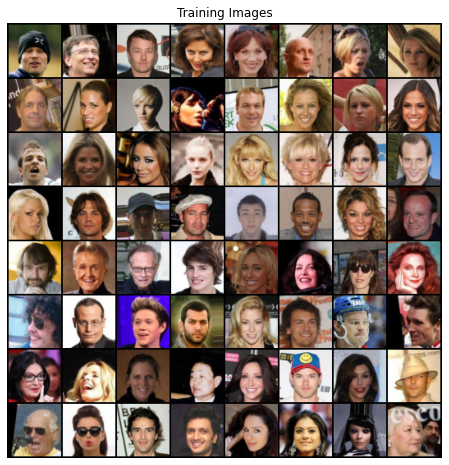

In [ ]:

# Creamos el dataset
dataset = datasets.ImageFolder(root=dataroot+'celeba',
                           transform=transform)
# Creamos el dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decidimos en dónde se hará el entrenamiento
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# graficamos algunas de sus imágenes
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

### <span style="color:blue">Inicialización de pesos</span>

Como se indica en el paper, todos los pesos tienen que ser inicializados de manera aleatoria siguiendo una distribución normal $N(0, 0.02)$. Asi que se hace una función que tome el modelo incializado y re inicialize todas las capas convolucionales, transpuestas y de normalización por lotes.

In [ ]:
# inicialización de pesos para el discriminador y el generador
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

### <span style="color:blue">Creación del generador</span>

Aquí vamos a crear una imagen a color de tamaño 64x64 a partir de un vector de números aleatorios te longitud 100. Esto lo logramos transformando este vector con las convoluciones para que llegue al mismo dominio que el de las imágenes reales.

Nótese que vamos lentamente cambiando la forma de los mapas de característica hasta obtener una de la misma dimensión que la base de datos. Obteniendo, potencialmente, una imagen que se parezca a esta.

In [ ]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # Se entra el vector de ruido a la primera convolución transpuesta
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # tamaño actual. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # tamaño actual. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # tamaño actual. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # tamaño actual. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # tamaño actual. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [ ]:
# creamos el generador
netG = Generator(ngpu).to(device)

# para uso de múltiples GPUs
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# aplicamos la aleatorización de pesos incializados
netG.apply(weights_init)

print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


### <span style="color:blue">Creación del discriminador</span>

En este caso, hacemos el paso absolutamente opuesto al generador. Tomamos una imagen completa, y vamos transformándola hasta obtener una forma de los datos que permita, al final, hacer una clasificación binaria. 
Nótese que en este caso, no hay capas completamente conectadas, el proceso de clasificación se hace a partir de convoluciones y una activación sigmoide.

Además, no hay ningún pooling, en su lugar, los kernel tienen un stride = 2 para, según el paper, "la red pueda aprender su propia función de pooling".

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # entrada es una imagen (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # tamaño actual. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # tamaño actual. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # tamaño actual. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # tamaño actual. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [ ]:
# Creamos el discriminador
netD = Discriminator(ngpu).to(device)

# para uso de múltiples GPUs
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# aplicamos la aleatorización de pesos incializados
netD.apply(weights_init)

print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


### <span style="color:blue">Pérdidas y Optimizadores</span>

In [ ]:
# perdida de entropía cruzada binaria
criterion = nn.BCELoss()

# hacemos un lote de vectores aleatorios para visualizar
#  el proceso de mejora del generador
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

#definimos las etiquetas de "falso" y "verdadero"
real_label = 1.
fake_label = 0.

# definimos los optimizadores de G y D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

### <span style="color:blue">Entrenamiento</span>

In [31]:
# Training Loop

# listas para seguir el progreso
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# para cada epoch
for epoch in range(num_epochs):
    # Para cada lote en el epoch
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Actualizamos la red D
        ###########################
        ## entrenamiento con las imágenes reales
        netD.zero_grad()
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # pasamos el lote de imágenes reales al discriminador
        output = netD(real_cpu).view(-1)
        # perdida del lote real
        errD_real = criterion(output, label)
        # backpropagation
        errD_real.backward()
        D_x = output.mean().item()

        ## entrenamiento con las imágenes falsas
        # Generamos lote de vectores aleatorios
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generamos imágenes falsas con G
        fake = netG(noise)
        label.fill_(fake_label)
        # Aplicamos clasificación de estos lotes falsos
        output = netD(fake.detach()).view(-1)
        # perdida del lote falso
        errD_fake = criterion(output, label)
        # calculamos los gradientes de este lote, acumulado con el anterior
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # computamos la perdida total de D como la suma de perdidas
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Actualizamos la red G
        ###########################
        netG.zero_grad()
        label.fill_(real_label)
        # al haber actualizado D, se hace otro paso con datos falsos usando el discriminador
        output = netD(fake).view(-1)
        # Calculamos la perdida del generador con base en que tan buena fue su capacidad de burlar a D
        errG = criterion(output, label)
        # Calculamos Gradientes
        errG.backward()
        D_G_z2 = output.mean().item()
        # actualizamos G
        optimizerG.step()

        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # hacemos unas generaciones parciales para ver el desempeño de G
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


[0/5][0/1583]	Loss_D: 0.7912	Loss_G: 4.2531	D(x): 0.5788	D(G(z)): 0.0119 / 0.0422
[0/5][50/1583]	Loss_D: 0.4546	Loss_G: 3.7945	D(x): 0.8190	D(G(z)): 0.1584 / 0.0390
[0/5][100/1583]	Loss_D: 0.7798	Loss_G: 3.0137	D(x): 0.6564	D(G(z)): 0.1641 / 0.0861
[0/5][150/1583]	Loss_D: 0.8303	Loss_G: 7.2737	D(x): 0.8592	D(G(z)): 0.4063 / 0.0020
[0/5][200/1583]	Loss_D: 0.4877	Loss_G: 3.4288	D(x): 0.7844	D(G(z)): 0.1518 / 0.0584
[0/5][250/1583]	Loss_D: 0.8152	Loss_G: 7.2679	D(x): 0.9171	D(G(z)): 0.3919 / 0.0019
[0/5][300/1583]	Loss_D: 0.4729	Loss_G: 5.3982	D(x): 0.8737	D(G(z)): 0.2243 / 0.0083
[0/5][350/1583]	Loss_D: 0.3406	Loss_G: 3.8058	D(x): 0.8305	D(G(z)): 0.0914 / 0.0351
[0/5][400/1583]	Loss_D: 0.7998	Loss_G: 5.4072	D(x): 0.5601	D(G(z)): 0.0078 / 0.0182
[0/5][450/1583]	Loss_D: 0.8133	Loss_G: 1.4734	D(x): 0.5962	D(G(z)): 0.1177 / 0.2926
[0/5][500/1583]	Loss_D: 0.3184	Loss_G: 3.6302	D(x): 0.8717	D(G(z)): 0.1418 / 0.0411
[0/5][550/1583]	Loss_D: 0.5097	Loss_G: 3.6300	D(x): 0.7855	D(G(z)): 0.1700 / 0.

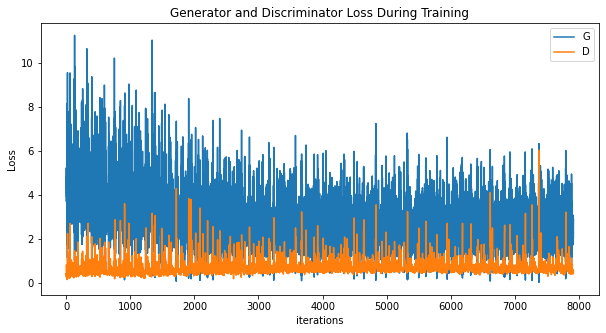

In [32]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

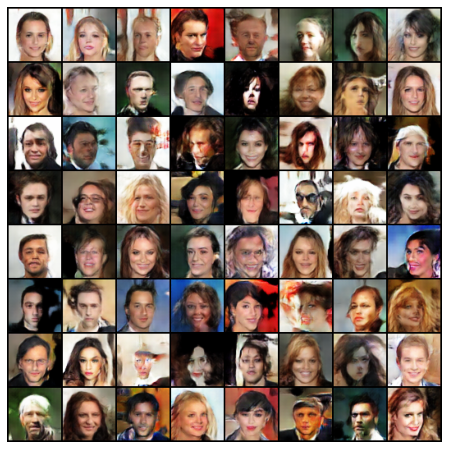

In [33]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


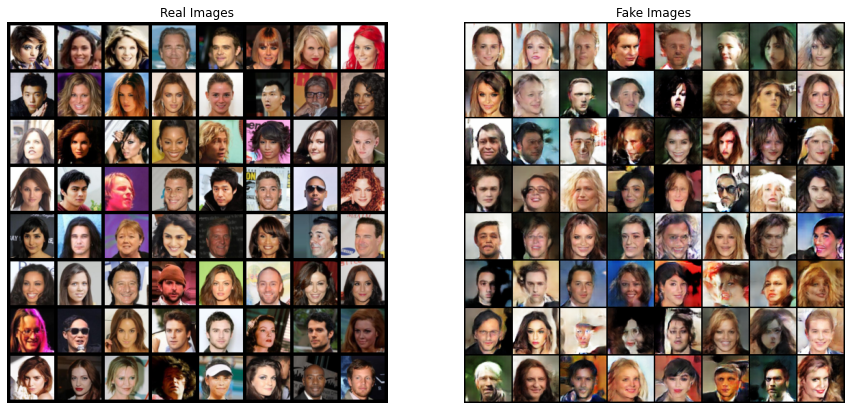

In [34]:
#tomamos un lote de imágenes reales

real_batch = next(iter(dataloader))

# graficamos imágenes reales
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# graficamos las imágenes falsas del último epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()